# ITCd on RGB images (Threshold Canopies with Watershed Segmentation)

In [1]:
INPUT_PATH = '../../ilim_ortho/'

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
import tifffile as tiff
from skimage.io import imread
import rasterio
from skimage.segmentation import watershed
from skimage.segmentation import mark_boundaries
from skimage.segmentation import find_boundaries
from skimage.morphology import binary_dilation
from skimage.exposure import equalize_adapthist
from skimage.filters import gaussian
from skimage.color import rgb2gray
from skimage.filters import threshold_mean, threshold_otsu
from skimage.feature import peak_local_max


In [9]:
INPUT_PATH = '/home/user/data/ilim_ortho/West 47 d1/'
IMAGE_PATH = 'West 47 d1.tif'
IMAGE_PATH_DEM = 'West 47 d1_DEM.tif'

In [10]:
with rasterio.open(INPUT_PATH + IMAGE_PATH_DEM) as src:
    img_DEM = src.read().transpose(1, 2, 0)
    profile = src.profile

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: RasterioDeprecationWarning: Creation keywords stored on datasets by Rasterio versions < 1.0b1 will always be ignored in version 1.0. You may opt in to ignoring them now by setting RIO_IGNORE_CREATION_KWDS=TRUE in your environment.
  This is separate from the ipykernel package so we can avoid doing imports until


In [11]:
img = img_DEM[3000:3500, 3000:3500, 0]
img_norm = (img - img.min()) / (img.max() - img.min())

/opt/conda/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from float32 to uint16
  .format(dtypeobj_in, dtypeobj_out))


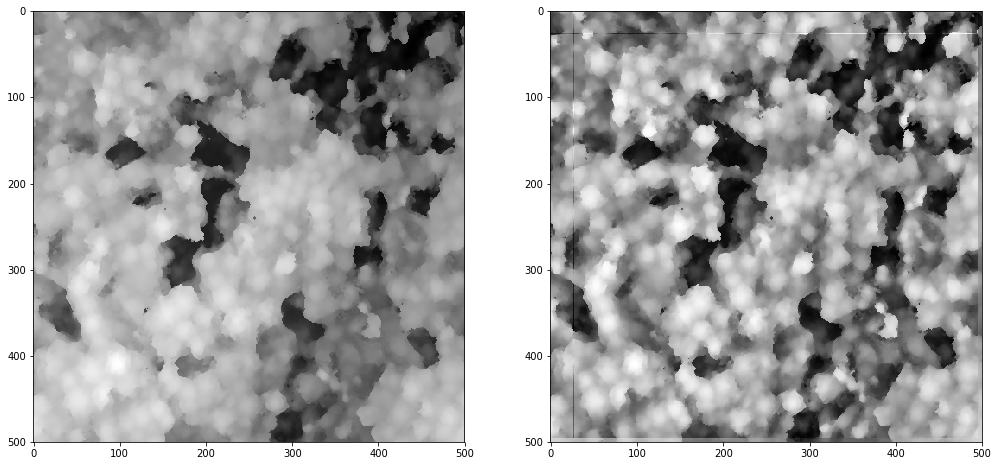

In [12]:
img_equlized = equalize_adapthist(img_norm)

plt.figure(figsize=(17,10))
plt.subplot(121)
plt.imshow(img_norm, cmap='gray')
plt.subplot(122)
plt.imshow(img_equlized, cmap='gray')
plt.show()

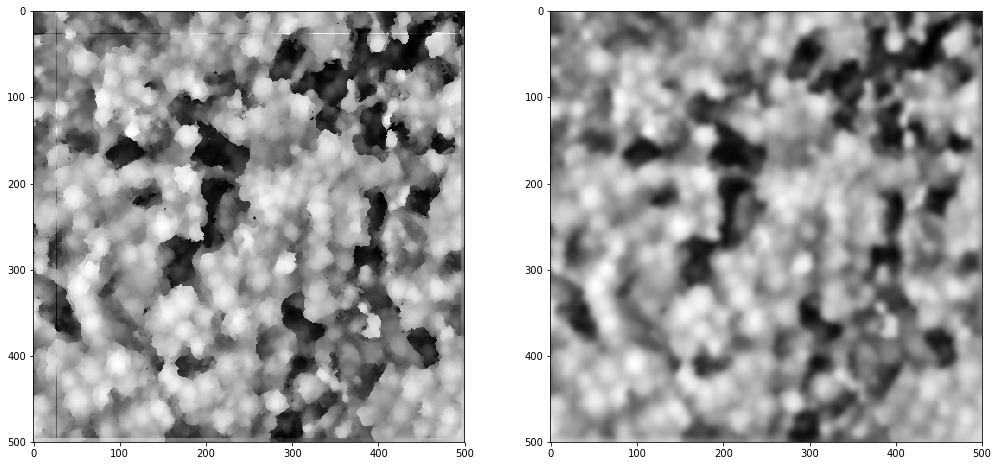

In [13]:
img_gaussian = gaussian(img_equlized, sigma=3)

plt.figure(figsize=(17,10))
plt.subplot(121)
plt.imshow(img_equlized, cmap='gray')
plt.subplot(122)
plt.imshow(img_gaussian, cmap='gray')
plt.show()

In [14]:
threshold_mean(img_gaussian), threshold_otsu(img_gaussian)

(0.5598716846905782, 0.513082838705647)

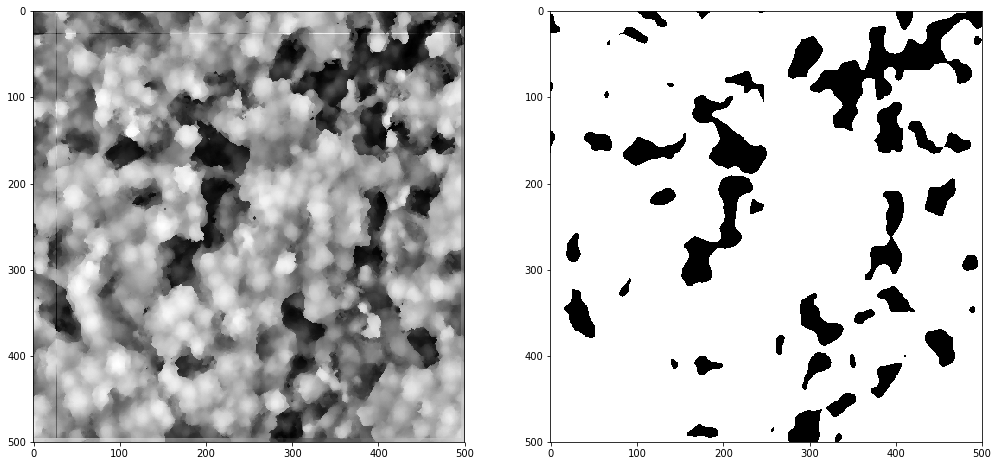

In [15]:
canopy_mask = img_gaussian > threshold_otsu(img_gaussian)-0.2

plt.figure(figsize=(17,10))
plt.subplot(121)
plt.imshow(img_equlized, cmap='gray')
plt.subplot(122)
plt.imshow(canopy_mask, cmap='gray')
plt.show()

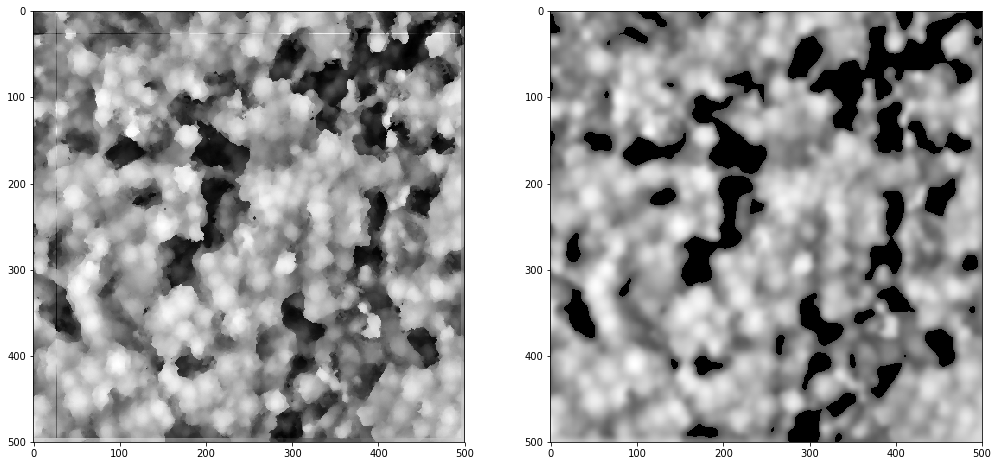

In [16]:
masked_gaussian = np.copy(img_gaussian)
masked_gaussian[canopy_mask==False] = 0

plt.figure(figsize=(17,10))
plt.subplot(121)
plt.imshow(img_equlized, cmap='gray')
plt.subplot(122)
plt.imshow(masked_gaussian, cmap='gray')
plt.show()

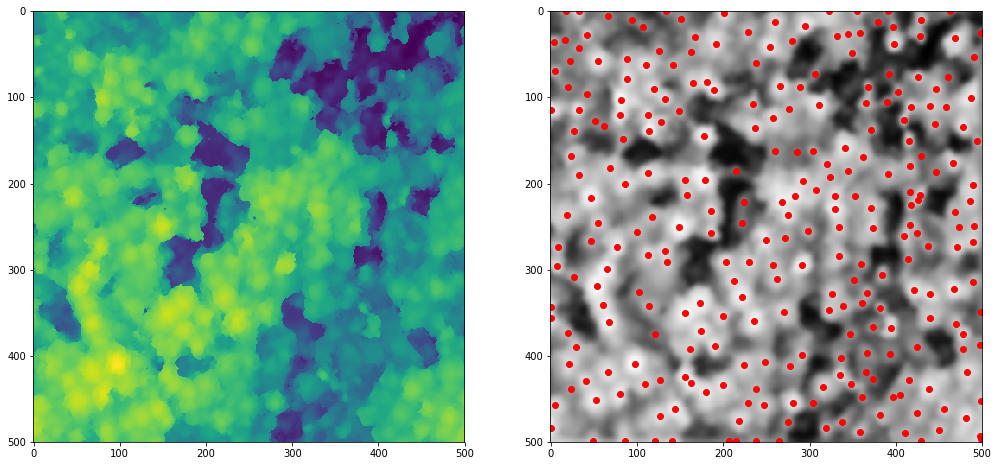

In [17]:
local_maxima = peak_local_max(masked_gaussian, min_distance=1, exclude_border=0)

plt.figure(figsize=(17,10))
plt.subplot(121)
plt.imshow(img_norm)
plt.subplot(122)
plt.imshow(img_gaussian, cmap='gray')
plt.plot(local_maxima[:, 1], local_maxima[:, 0], 'r.', markersize=12)
plt.show()

In [18]:
def draw_boundaries(image, segments, n_dilation=1):
    boundaries = find_boundaries(segments)
    for i in range(n_dilation):
        boundaries = binary_dilation(boundaries)
    img_bounds = np.zeros(image.shape)
    img_bounds1 = np.zeros(image.shape)
    img_bounds[np.where(boundaries==True)] = 1
    img_bounds1[boundaries == True] = 1
    return img_bounds

In [19]:
local_maxima = peak_local_max(masked_gaussian, min_distance=1, exclude_border=0, indices=False)
markers, n_labels = ndi.label(local_maxima)
segments = watershed(-img_gaussian, markers, mask=canopy_mask)
segments[np.where((segments==0) & (canopy_mask==True))] = n_labels+1

In [20]:
img_bounds = draw_boundaries(img_norm, segments)

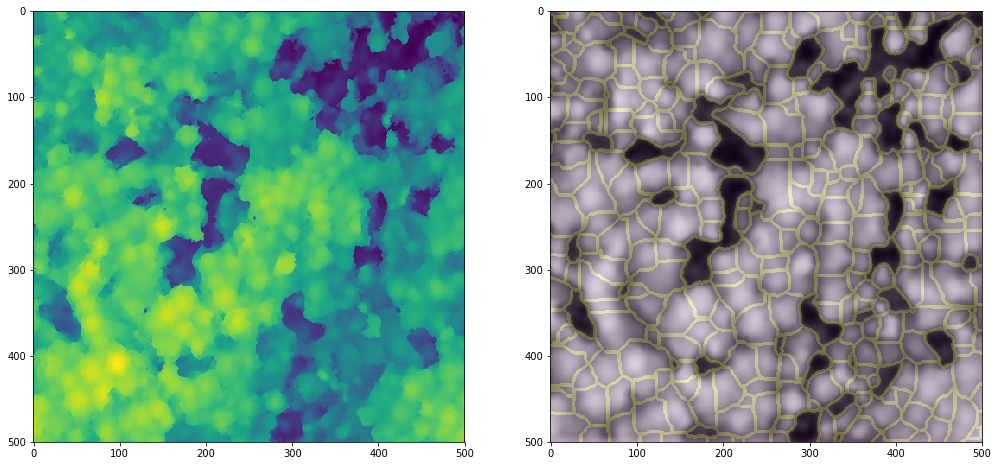

In [21]:
plt.figure(figsize=(17,10))
plt.subplot(121)
plt.imshow(img_norm)
plt.subplot(122)
plt.imshow(img_gaussian, cmap='gray')
plt.imshow(img_bounds, alpha=0.2)
plt.show()

# We will train the model on the ITC data
U-Resnet-34 for forest segmentation, which was provided by Aeronet laboratory.


In [22]:
import keras
from segmentation_models import Unet
import cv2

import aeronet.dataset as ds
from functools import wraps
from torch.utils.data import DataLoader
from aeronet.dataset.utils import parse_directory

Using TensorFlow backend.
/opt/conda/lib/python3.6/site-packages/classification_models/resnext/__init__.py:4: UserWarning: Current ResNext models are deprecated, use keras.applications ResNeXt models
  warnings.warn('Current ResNext models are deprecated, '


In [2]:
base_model = keras.models.load_model('/home/user/data/Models/ForestSegmentationModel3.h5')

/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [3]:
# new head
x = keras.layers.Conv2D(3, (1,1))(base_model.layers[-1].layers[-3].output)
out = keras.layers.Activation(activation='softmax')(x)

inner_model = keras.models.Model(inputs=[base_model.layers[-1].layers[0].input], outputs=[out])

In [13]:
# Attach lambda layer
y = inner_model(base_model.layers[1].output)
model = keras.models.Model(inputs=[base_model.layers[0].input], outputs=[y])

In [23]:
train_data = []
CHANNELS = ['RED', 'GREEN', 'BLUE']
LABELS = ['bounds', 'trees', 'bg']
folders = ['/home/user/data/ITC_dataset/irkutsk2_marked',
           '/home/user/data/ITC_dataset/perm1_marked']
for folder in folders:
    filenames=parse_directory(folder, CHANNELS+LABELS)
    train_data.append(ds.BandCollection(filenames))


In [32]:
train_dataset

In [24]:
train_dataset = ds.RandomDataset(train_data, (256, 256), CHANNELS, LABELS)

@wraps(DataLoader)
def segmentation_generator(*args, **kwargs):
    while True:
        data_loader = DataLoader(*args, **kwargs)
        for batch in data_loader:
            images = batch['image']
            masks = batch['mask']
            yield images.numpy(),  masks.numpy()

train_dataloader = segmentation_generator(train_dataset, batch_size=16, num_workers=0)

In [36]:
imgs.shape

(2, 256, 256, 3)

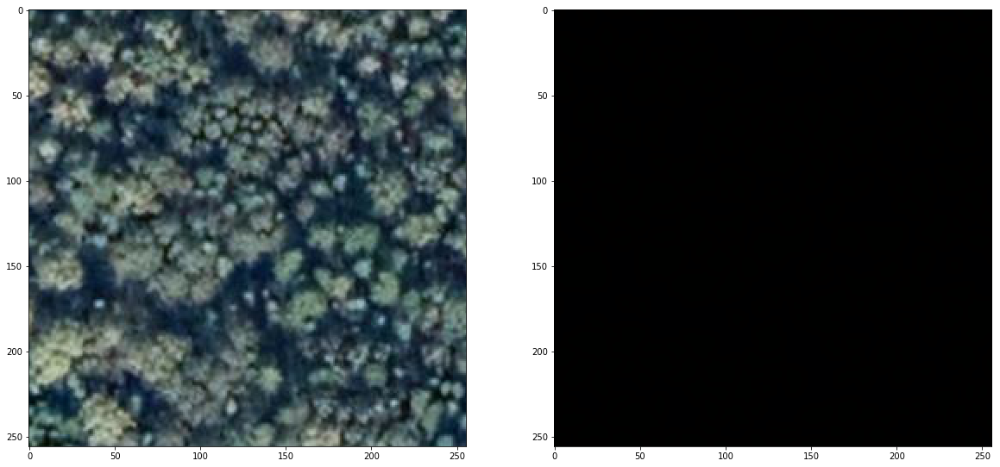

In [28]:
imgs, masks = train_dataloader.__next__()
img = imgs[1]
mask=masks[1]

plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)


plt.subplot(122)
plt.imshow(mask*255)
plt.show()

In [20]:
opt = keras.optimizers.Adam(lr=0.0001)
loss = keras.losses.categorical_crossentropy
metrics = [keras.metrics.categorical_crossentropy]
model.compile(optimizer=opt, loss=loss, metrics=metrics)


In [21]:
history = model.fit_generator(train_dataloader,
                              steps_per_epoch=100,
                              validation_data=train_dataloader,
                              validation_steps=50,
                              epochs=10, workers=0)

Epoch 1/10
100/100 [==============================] - 78s 781ms/step - loss: 0.9936 - categorical_crossentropy: 0.9936 - val_loss: 0.9109 - val_categorical_crossentropy: 0.9109
Epoch 2/10
100/100 [==============================] - 73s 730ms/step - loss: 0.7400 - categorical_crossentropy: 0.7400 - val_loss: 0.8252 - val_categorical_crossentropy: 0.8252
Epoch 3/10
100/100 [==============================] - 73s 731ms/step - loss: 0.6002 - categorical_crossentropy: 0.6002 - val_loss: 0.6634 - val_categorical_crossentropy: 0.6634
Epoch 4/10
100/100 [==============================] - 73s 729ms/step - loss: 0.5160 - categorical_crossentropy: 0.5160 - val_loss: 0.5620 - val_categorical_crossentropy: 0.5620
Epoch 5/10
100/100 [==============================] - 73s 732ms/step - loss: 0.4599 - categorical_crossentropy: 0.4599 - val_loss: 0.4960 - val_categorical_crossentropy: 0.4960
Epoch 6/10
100/100 [==============================] - 73s 732ms/step - loss: 0.4243 - categorical_crossentropy: 0.4

In [22]:
def predict(model, image_name):
    with rasterio.open(image_name) as src:
        img = src.read().transpose(1,2,0)
    if img.shape[0] > 1024 or img.shape[1] > 2048:
        print('Too big')
        return None
    pad_0 = 1024 - img.shape[0]
    pad_1 = 2048 - img.shape[1]
    img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')
    mask = model.predict(np.array([img_pad]))
    return mask[0, :img.shape[0], :img.shape[1]], img

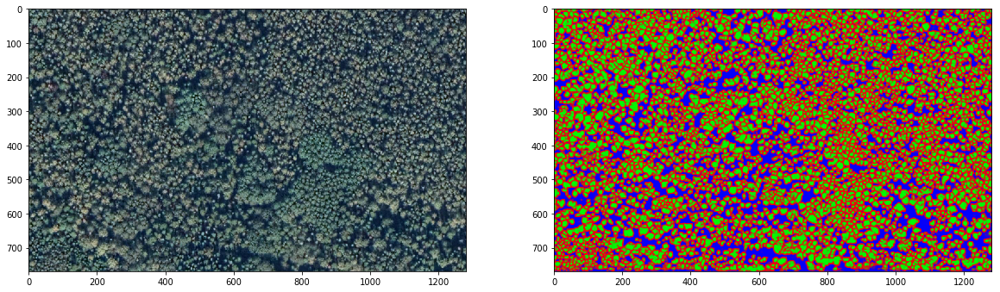

In [47]:
region = 'perm1'
image_name = '/home/user/data/ITC_dataset/perm1_marked/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(mask)
plt.show()

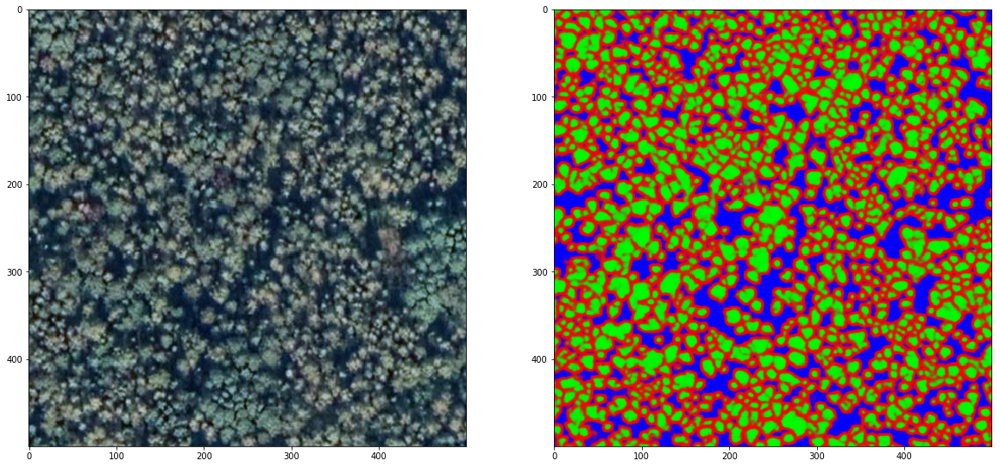

In [39]:
def plot_results(img, mask, miny=0, maxy=-1, minx=0, maxx=-1):
    plt.figure(figsize=(20,10))
    
    img_b = np.array([img[:,:,0].astype(np.uint16) + np.uint16((mask[:, :, 1]>0.5))*255, img[:,:,1] , img[:,:,2]]).transpose(1,2,0)

    plt.subplot(121)
    plt.imshow(img[miny:maxy, minx:maxx])
    plt.subplot(122)
    plt.imshow(mask[miny:maxy, minx:maxx])
    plt.show()

plot_results(img, mask, 0,500,0,500)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


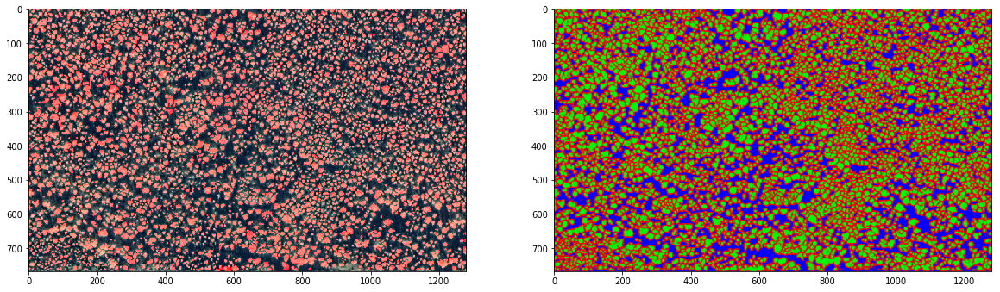

In [29]:
plot_results(img, mask)

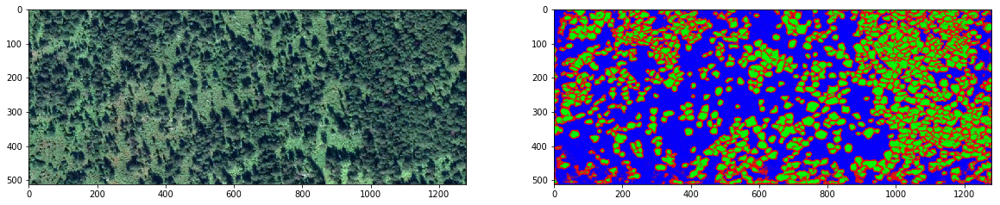

In [40]:
image_name = '/home/user/data/ITC_dataset/irkutsk2_marked/orthophoto.tif'
mask, img = predict(model, image_name)
plot_results(img, mask)

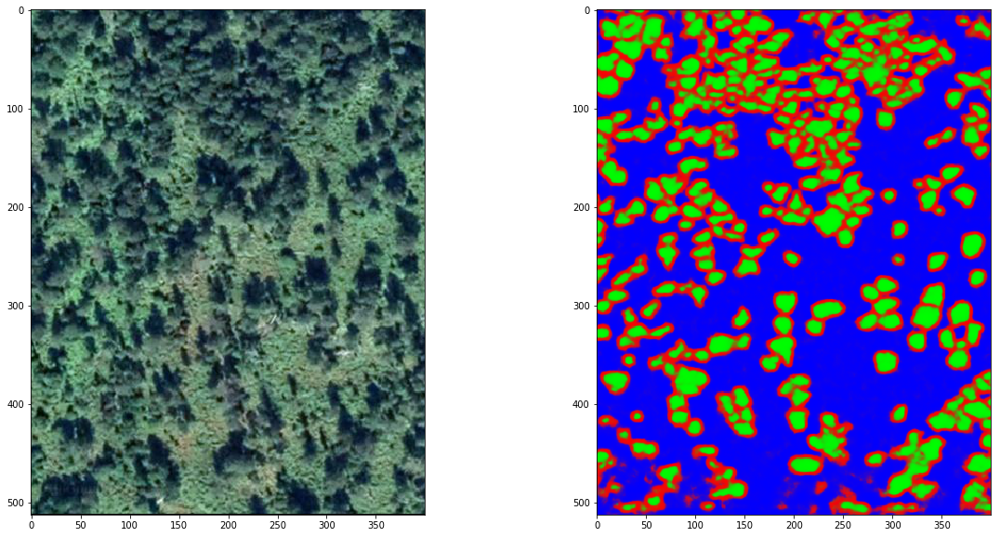

In [41]:
plot_results(img, mask, 0,900,100,500)

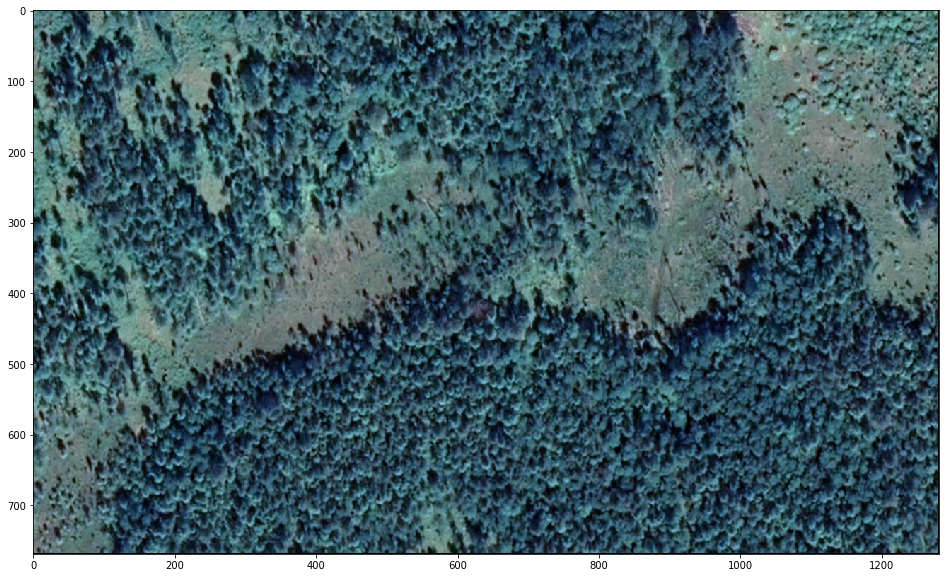

In [50]:
image_name = '/home/user/data/ITC_dataset/irkutsk1/orthophoto.tif'
mask, img = predict(model, image_name)
plt.figure(figsize=(20,10))
plt.imshow(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


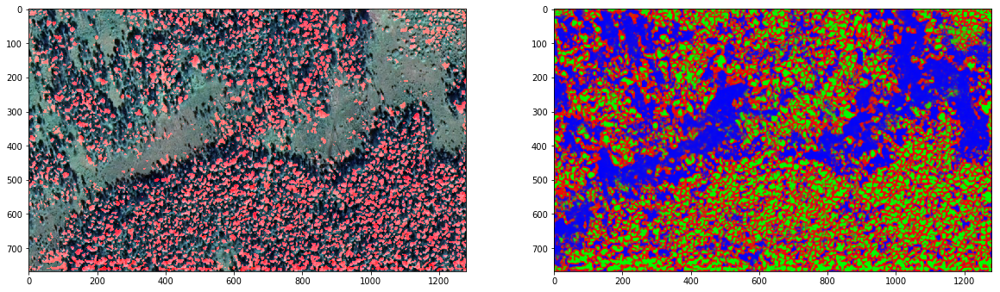

In [37]:
plot_results(img, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


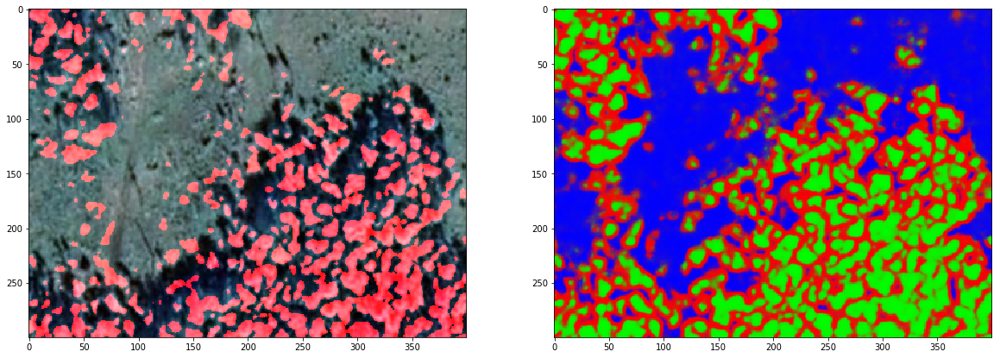

In [29]:
plot_results(img, mask, miny=200, maxy=500, minx=800, maxx=1200)